In [1]:
#default_exp celeba_icao

In [2]:
#export
from fastai import *
from fastai.vision import *
from pathlib import PosixPath
import cv2
from fastai.callbacks.hooks import *
from fastai.callbacks import *
from fastai.utils.mem import *
from facelib.core import save_inference, load_inference

from torchvision.models import vgg16_bn
from torchvision import models as torchmodels

def save_torch_inference(model, path):
    torch.save(model.state_dict(), path)
    
def load_torch_inference(model, path, device=torch.device('cpu')):
    model.load_state_dict(torch.load(path, map_location=device))
    model.eval()

In [3]:
def get_predictions(learner):
    y_true, y_pred = None, None
    for x,yt in learner.data.valid_dl:
        yp = learner.model.eval()(x).squeeze().detach()
        if y_true is None: y_true, y_pred = yt.cpu(), yp.cpu()
        else:
            y_true = torch.cat([y_true, yt.cpu()], dim=0)
            y_pred = torch.cat([y_pred, yp.cpu()], dim=0)
    return y_pred, y_true

def calculate_metrics(learner):
    y_pred, y_true = get_predictions(learner)
    return {name:float(func(y_pred, y_true)) for func, name in zip(learner.metrics, learner.recorder.metrics_names)}

In [4]:
original_images_dir = Path('/data/faces/CELEBA/images/img_align_celeba/')
attr_path = Path('/data/faces/CELEBA/list_attr_celeba.txt')
images_dir = Path('../data/face/cropped_celeba/')

In [ ]:
imagenet_stats

In [5]:
from facenet_pytorch import MTCNN
mtcnn = MTCNN(
    image_size=224, margin=0, min_face_size=20,
    thresholds=[0.6, 0.7, 0.7], factor=0.709, post_process=False,
    device='cpu'
)

from torchvision import datasets
class ImagesWithPath(datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super().__getitem__(index)
        path = self.imgs[index][0]
        return (original_tuple + (path,))

dataset = ImagesWithPath(str(original_images_dir.parent))
dataset.idx_to_class = {i:c for c, i in dataset.class_to_idx.items()}
loader = DataLoader(dataset, collate_fn=lambda x: x[0], num_workers=1)

In [9]:
def create_cropped_images():
    not_found_names = []
    for x, y, path in progress_bar(loader):
        try:Image(mtcnn(x)/255.).save(str(images_dir/Path(path).name))
        except: not_found_names.append(Path(path).name)
    return not_found_names
# not_found_names = create_cropped_images()
not_found_names = list(filter(lambda p: not (images_dir/p).exists(), [path.name for path in get_image_files(original_images_dir)]))
len(not_found_names)

296

In [10]:
attr_names = open(attr_path).readlines()[1].split(' ')[:-1] # len = 40
data = []
for l in open(attr_path).readlines()[2:]:
    name, *attributes = filter(lambda x: x != '', l[:-1].split(' '))
    attributes = [name for a,name in zip(attributes, attr_names) if a == '1']
    data.append((name, ' '.join(attributes)))
data = filter(lambda x: x[0] not in not_found_names, data)
df = pd.DataFrame(data, columns=['img_name', 'attributes'])
df

,img_name,attributes
0,000001.jpg,Arched_Eyebrows Attractive Brown_Hair Heavy_Ma...
1,000002.jpg,Bags_Under_Eyes Big_Nose Brown_Hair High_Cheek...
2,000003.jpg,Big_Lips Blurry Male Narrow_Eyes No_Beard Poin...
3,000004.jpg,Attractive No_Beard Pointy_Nose Straight_Hair ...
4,000005.jpg,Arched_Eyebrows Attractive Big_Lips Heavy_Make...
...,...,...
202298,202595.jpg,Attractive Big_Lips Blond_Hair No_Beard Wearin...
202299,202596.jpg,Bangs Big_Lips Blond_Hair High_Cheekbones Male...
202300,202597.jpg,Black_Hair Eyeglasses High_Cheekbones Male Mou...
202301,202598.jpg,Arched_Eyebrows Attractive Big_Lips Black_Hair...


In [11]:
def get_src():
    return (ImageList.from_df(df, images_dir, cols=['img_name'])
       .split_by_rand_pct(0.1, seed=42)
       .label_from_df(label_delim=' ')
    )

In [12]:
def get_data(src, size, tfms=get_transforms(), bs=4):
    data = (src.transform(tfms, size=size)
            .databunch(bs=bs)
            .normalize(imagenet_stats))
    return data

In [25]:
src = get_src()
tfms = get_transforms(flip_vert=False, max_lighting=0.1, max_zoom=1.05, max_warp=0., max_rotate=7)
data = get_data(src, 64, tfms=tfms)
data

ImageDataBunch;

Train: LabelList (182073 items)
x: ImageList
Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64)
y: MultiCategoryList
Arched_Eyebrows;Attractive;Brown_Hair;Heavy_Makeup;High_Cheekbones;Mouth_Slightly_Open;No_Beard;Pointy_Nose;Smiling;Straight_Hair;Wearing_Earrings;Wearing_Lipstick;Young,Bags_Under_Eyes;Big_Nose;Brown_Hair;High_Cheekbones;Mouth_Slightly_Open;No_Beard;Smiling;Young,Big_Lips;Blurry;Male;Narrow_Eyes;No_Beard;Pointy_Nose;Wavy_Hair;Young,Attractive;No_Beard;Pointy_Nose;Straight_Hair;Wearing_Earrings;Wearing_Lipstick;Wearing_Necklace;Young,Arched_Eyebrows;Attractive;Big_Lips;Brown_Hair;Heavy_Makeup;Mouth_Slightly_Open;No_Beard;Wavy_Hair;Wearing_Earrings;Wearing_Lipstick;Young
Path: ../data/face/cropped_celeba;

Valid: LabelList (20230 items)
x: ImageList
Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64)
y: MultiCategoryList
5_o_Clock_Shadow;Attractive;Black_Hair;Bushy_Eyebrows;Male;

In [14]:
print(data.classes)

['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']


/home/dominykas/anaconda3/envs/nlp/lib/python3.7/site-packages/fastai/vision/data.py:306: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


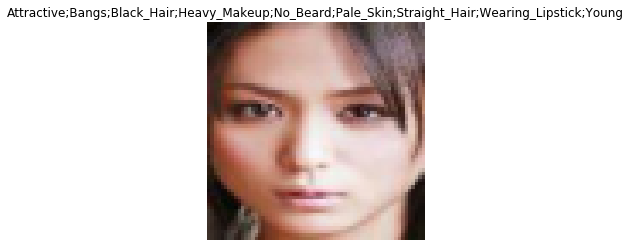

In [272]:
data.show_batch(rows=1)

In [ ]:
acc_02 = partial(accuracy_thresh, thresh=0.2)
f_score = partial(fbeta, thresh=0.2)
learner = cnn_learner(data, torchmodels.resnet18, metrics=[acc_02, f_score])

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


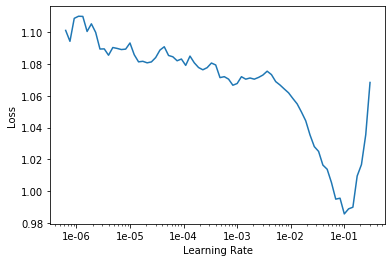

In [402]:
learner.lr_find()
learner.recorder.plot(skip_end=10)

In [403]:
tfms = get_transforms(flip_vert=False, max_lighting=0.1, max_zoom=1.05, max_warp=0., max_rotate=7)
learner.data = get_data(src, 64, bs=128, tfms=tfms)
learner.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.389127,0.332008,0.786135,0.707479,00:44
1,0.275894,0.259514,0.818642,0.777884,00:44
2,0.255900,0.241599,0.837061,0.793650,00:44
3,0.248763,0.235000,0.845790,0.798172,00:44
4,0.242796,0.231159,0.843381,0.803323,00:45
5,0.241442,0.228245,0.847385,0.806145,00:45
6,0.238857,0.226787,0.847316,0.807924,00:45
7,0.236561,0.225624,0.849195,0.808652,00:45
8,0.236150,0.224989,0.847935,0.809409,00:45
9,0.235939,0.225095,0.847667,0.809402,00:45


In [404]:
learner.data = get_data(src, 128, bs=64, tfms=tfms)
learner.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.248959,0.236322,0.840487,0.799037,01:32
1,0.239763,0.224849,0.852865,0.807866,01:33
2,0.234443,0.221499,0.858645,0.810501,01:33
3,0.231223,0.217029,0.860915,0.814348,01:33
4,0.229206,0.215341,0.859480,0.816606,01:33
5,0.226270,0.213172,0.859038,0.818974,01:33
6,0.224026,0.211451,0.859298,0.821159,01:32
7,0.225314,0.210777,0.859741,0.822029,01:33
8,0.224517,0.210308,0.859556,0.822536,01:33
9,0.222601,0.210028,0.860628,0.822583,01:33


In [405]:
learner.data = get_data(src, 224, bs=32, tfms=tfms)
learner.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.241982,0.221561,0.851380,0.812588,04:23
1,0.236447,0.217310,0.856068,0.816491,04:22
2,0.235246,0.216086,0.859299,0.816915,04:23
3,0.235528,0.213513,0.863039,0.818403,04:22
4,0.227164,0.211838,0.861530,0.819923,04:23
5,0.229105,0.211339,0.864736,0.821129,04:22
6,0.226089,0.207653,0.863059,0.824600,04:22
7,0.224349,0.206737,0.864695,0.825232,04:22
8,0.222954,0.206493,0.863579,0.825513,04:23
9,0.221266,0.206185,0.864558,0.826067,04:23


In [406]:
learner.unfreeze()
learner.data = get_data(src, 224, bs=32, tfms=tfms)
learner.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.226739,0.221063,0.866043,0.809374,06:17
1,0.224419,0.214600,0.866873,0.818368,06:16
2,0.222285,0.206982,0.861068,0.826635,06:18
3,0.216217,0.204219,0.872990,0.826822,06:16
4,0.212034,0.199684,0.871384,0.832645,06:16
5,0.207190,0.195678,0.874029,0.835410,06:16
6,0.204596,0.192527,0.876562,0.838146,06:16
7,0.200682,0.190062,0.877865,0.840425,06:16
8,0.195339,0.188923,0.880688,0.840933,06:16
9,0.196477,0.188970,0.881324,0.841524,06:16


In [407]:
save_torch_inference(learner.model[0], '../models/celeba_resnet18.pth')

In [409]:
# learner.fit_one_cycle(100, 1e-3) # .90 acc, .81 f1
save_torch_inference(learner.model[0], '../models/celeba_resnet18_longtraining.pth')

# Head Models

In [15]:
celeba_resnet = nn.Sequential(*list(torchmodels.resnet18().children())[:-2]).eval().cuda()
load_torch_inference(celeba_resnet, '../models/celeba_resnet18_longtraining.pth')
celeba_resnet(torch.zeros(4,3,224,224).cuda()).shape

torch.Size([4, 512, 7, 7])

In [16]:
class Reshape(nn.Module):
    def __init__(self, *size):
        super().__init__()
        self.size = size
    def forward(self, x):
        return x.reshape(x.shape[0], *self.size)

class ZeroOut(nn.Module):
    def __init__(self, h=None, w=None):
        super().__init__()
        if h is not None:
            self.h_slice = torch.ones(1,1,7,7)
            self.h_slice[:,:,h,:] = 0
        else: self.h_slice = None
        if w is not None:
            self.w_slice = torch.ones(1,1,7,7)
            self.w_slice[:,:,w,:] = 0
        else: self.w_slice = None
        
    def forward(self, x):
        if self.h_slice is not None: x = x * self.h_slice.to(x.device)
        if self.w_slice is not None: x = x * self.w_slice.to(x.device)
        return x
    
def bn_drop_lin(n_in, n_out, bn=True, p=0., actn=None):
    layers = [nn.BatchNorm1d(n_in)] if bn else []
    if p != 0: layers.append(nn.Dropout(p))
    layers.append(nn.Linear(n_in, n_out))
    if actn is not None: layers.append(actn)
    return layers

def init_default(m, func=nn.init.kaiming_normal_):
    if func:
        if hasattr(m, 'weight'): func(m.weight)
        if hasattr(m, 'bias') and hasattr(m.bias, 'data'): m.bias.data.fill_(0.)
    return m

def conv_layer(ni, nf, ks=3, stride=1, padding=None, bias=None, use_activ=True, init=nn.init.kaiming_normal_, bn=True, is_1d=False):
    if padding is None: padding = (ks-1)//2
    if bias is None: bias = not bn
    conv = init_default(nn.Conv2d(ni, nf, kernel_size=ks, bias=bias, stride=stride, padding=padding), init)
    layers = [conv]
    if use_activ: layers.append(nn.ReLU(True))
    if bn: layers.append((nn.BatchNorm1d if is_1d else nn.BatchNorm2d)(nf))
    return nn.Sequential(*layers)

class Bin2CatLayer(nn.Module):
    def __init__(self):
        super().__init__()
    def forward(self, x):
        return torch.cat([1-x,x], axis=-1)

def create_head(num_classes, zero_h=None, zero_w=None, body_nf=512, num_emb=128, p=.5, ks=5):
    head = nn.Sequential(
#         ZeroOut(zero_h, zero_w), nn.AdaptiveAvgPool2d([1,1]), Reshape(-1),
#         nn.AdaptiveAvgPool2d([1,1]), Reshape(-1),
#         *bn_drop_lin(body_nf, num_emb, p=p, actn=nn.ReLU()), nn.Linear(num_emb, num_classes)
        ZeroOut(zero_h, zero_w),
        conv_layer(body_nf, 10, ks=ks), Reshape(-1), *bn_drop_lin(10*7*7, num_emb, p=p, actn=nn.ReLU()), nn.Linear(num_emb, num_classes)
    )
    return head

In [17]:
resnet = nn.Sequential(*list(models.resnet18(pretrained=True).children())[:-2]).cuda().eval()
# apply_init(resnet_ae, nn.init.kaiming_normal_)
# for param in resnet_ae.parameters(): param.requires_grad = False
resnet(torch.zeros(1,3,224,224).cuda()).shape

torch.Size([1, 512, 7, 7])

In [18]:
test_ae, test_data = celeba_resnet, torch.ones(4,3,224,224)
out1 = test_ae.eval()(test_data.cuda())
out2 = test_ae.eval()(test_data.cuda())
(out2 == out1).all()

tensor(True, device='cuda:0')

# MouthOpen

In [26]:
def create_celeba_dataset(out_dir='../data/icao/mouthopen_celeba/', lbl_name='Mouth_Slightly_Open', true_lbl='MouthOpen', false_lbl='MouthClosed'):
    out_dir = Path(out_dir)
    for im_name, attrs in progress_bar(list(zip(df['img_name'], df['attributes']))):
        if lbl_name in attrs: out_path = out_dir/true_lbl/im_name
        else: out_path = out_dir/false_lbl/im_name
        open_image(images_dir/im_name).save(out_path)
# create_celeba_dataset()

In [27]:
from facelib.core import read_dict
mouthopen_test_image_names = read_dict('../data/icao/mouthopen_testdata.pkl')
mouthopen_test_split_func = lambda path: Path(path).name in mouthopen_test_image_names
len(mouthopen_test_image_names)

1105

In [169]:
def get_binary_data(folder, tfms, split_func=None, main_class=None, bs=64, size=224):
    if split_func is None: src = ImageList.from_folder(folder).split_by_rand_pct(0.1, seed=42).label_from_folder()
    else: src = ImageList.from_folder(folder).split_by_valid_func(split_func).label_from_folder()
    data = get_data(src, size, bs=bs, tfms=tfms)
    if main_class is not None: assert data.classes[1] == main_class
    return data
data = get_binary_data('../data/icao/mouthopen_celeba/', tfms)
data

ImageDataBunch;

Train: LabelList (182976 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
MouthOpen,MouthOpen,MouthOpen,MouthOpen,MouthOpen
Path: ../data/icao/mouthopen_celeba;

Valid: LabelList (20330 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
MouthClosed,MouthOpen,MouthClosed,MouthOpen,MouthClosed
Path: ../data/icao/mouthopen_celeba;

Test: None

In [29]:
data.classes

['MouthClosed', 'MouthOpen']

In [30]:
# data.show_batch()

In [31]:
out2 = test_ae.eval()(test_data.cuda())
(out2 == out1).all()

tensor(True, device='cuda:0')

In [32]:
# data.show_batch()

In [33]:
def create_head_model(body, head):
    class AE_Model(nn.Module):
        def __init__(self, head):
            super().__init__()
            self.head = head
        def forward(self, x):
            return self.head(body.eval()(x))
    return AE_Model(head)

In [421]:
# head = create_head(num_classes=data.c, zero_h=[0,1,2,3], zero_w=[0,1,5,6], body_nf=512)
# head = create_head(num_classes=1, zero_h=[0,1,2,3])
head = create_head(num_classes=1)
model = create_head_model(test_ae, head)
# model = nn.Sequential(test_ae.eval(), head)
# load_torch_inference(model, '../models/celeba_head_mouthopen.pth')
head(torch.ones(4,512,7,7)).shape

torch.Size([4, 1])

In [35]:
# learner = cnn_learner(data, models.resnet18, pretrained=False, metrics=error_rate)

In [36]:
def binary_crossentropy(y_pred, y_true, pc=1., **kwargs):
    return nn.BCEWithLogitsLoss(pos_weight=tensor(pc), **kwargs)(y_pred.squeeze(), y_true.type(torch.float32))

In [37]:
def skmetric(metric_func, thresh=0.5, name=None):
    def f(y_pred, y_true):
        y_pred = (nn.Sigmoid()(y_pred) > thresh).long().squeeze()
        return tensor(metric_func(y_true, y_pred))
    name = metric_func.__name__ if name is None else name
    f.__name__ = name + str(thresh)
    return f

In [422]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
def negatives_recall_score(y_true, y_pred): # works only w/ binary classifier!
    return recall_score(1-y_true, 1-y_pred)

thresh_range = (2,10,3)
metrics = [
    skmetric(accuracy_score, thresh=0.5, name='acc'),
    *[skmetric(recall_score, thresh=t/10, name='r') for t in range(*thresh_range)],
    *[skmetric(precision_score, thresh=t/10, name='p') for t in range(*thresh_range)],
    *[skmetric(negatives_recall_score, thresh=t/10, name='-r') for t in range(*thresh_range)],
#     *[skmetric(accuracy_score, thresh=t/10, name='a') for t in range(*thresh_range)],
]

In [423]:
def focal_loss(y_pred, y_true, gamma=1.0, sigmoid=True):
    if sigmoid: y_pred = nn.Sigmoid()(y_pred)
    # CE = -log(pt), where pt is prob of correct class
    CE = F.binary_cross_entropy(y_pred.squeeze(), y_true.float(), reduction='none')
    pt = torch.exp(-CE)
    return torch.mean( (1-pt)**gamma * CE )

epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.033204,0.048417,0.927602,0.115837,0.106740,0.045487,0.103771,0.112706,0.115837,0.552384,0.874278,0.940271,06:33
1,0.030643,0.053162,0.932127,0.114932,0.110074,0.062443,0.104746,0.111382,0.115837,0.647825,0.874765,0.933937,06:35
2,0.029288,0.049221,0.933032,0.114932,0.108264,0.052441,0.103771,0.112789,0.115837,0.622068,0.878803,0.936652,06:35


/home/dominykas/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples.
  'recall', 'true', average, warn_for)
/home/dominykas/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


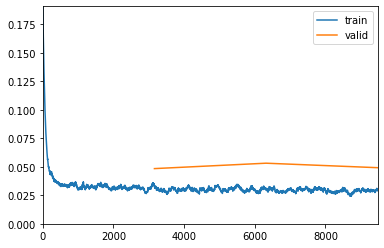

In [424]:
data = get_binary_data('../data/icao/mouthopen_celeba/', tfms, split_func=mouthopen_test_split_func)
# loss_func = partial(binary_crossentropy, pc=2.0)
loss_func = partial(focal_loss, gamma=2.0)
learner = ( Learner(data, model, loss_func=loss_func, metrics=metrics, callback_fns=[ShowGraph]) )
# load_torch_inference(learner.model.head, '../models/celeba_head_mouthopen.pth')
learner.fit(3, 1e-4)

In [425]:
calculate_metrics(learner)

{'acc0.5': 0.9330316781997681,
 'r0.2': 0.9901960492134094,
 'r0.5': 0.9313725233078003,
 'r0.8': 0.46078431606292725,
 'p0.2': 0.229545459151268,
 'p0.5': 0.5864197611808777,
 'p0.8': 0.8867924809455872,
 '-r0.2': 0.6620139479637146,
 '-r0.5': 0.9332004189491272,
 '-r0.8': 0.9940179586410522}

In [426]:
save_torch_inference(learner.model.head, '../models/celeba_head_mouthopen.pth')

In [451]:
data = get_binary_data('../data/icao/mouthopen_celeba_black/', tfms, split_func=mouthopen_test_split_func)
loss_func = partial(binary_crossentropy, pc=0.8)
# loss_func = partial(focal_loss, gamma=2.0)
learner = ( Learner(data, model, loss_func=loss_func, metrics=metrics, callback_fns=[ShowGraph]) )
load_torch_inference(learner.model.head, '../models/celeba_head_mouthopen.pth')
# learner.fit(1, 1e-10)

In [452]:
# save_torch_inference(learner.model.head, '../models/celeba_head_mouthopen_black.pth')

In [453]:
out2 = test_ae.eval()(test_data.cuda())
(out2 == out1).all()

tensor(True, device='cuda:0')

In [454]:
class Binary2Categorical_Model(nn.Module):
    def __init__(self, model, true_first=False):
        super().__init__()
        self.model, self.true_first = model, true_first
    def forward(self, x):
        y = nn.Sigmoid()( self.model(x) )
        return torch.cat(([y, 1-y] if self.true_first else [1-y, y]), axis=-1)

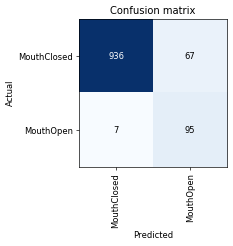

In [455]:
pred_learner = Learner(data, model, loss_func=CrossEntropyFlat())
pred_learner.model = Binary2Categorical_Model(learner.model)
interp = ClassificationInterpretation.from_learner(pred_learner)
interp.plot_confusion_matrix(figsize=(4,4), dpi=60)

In [456]:
# pred_learner.show_results()

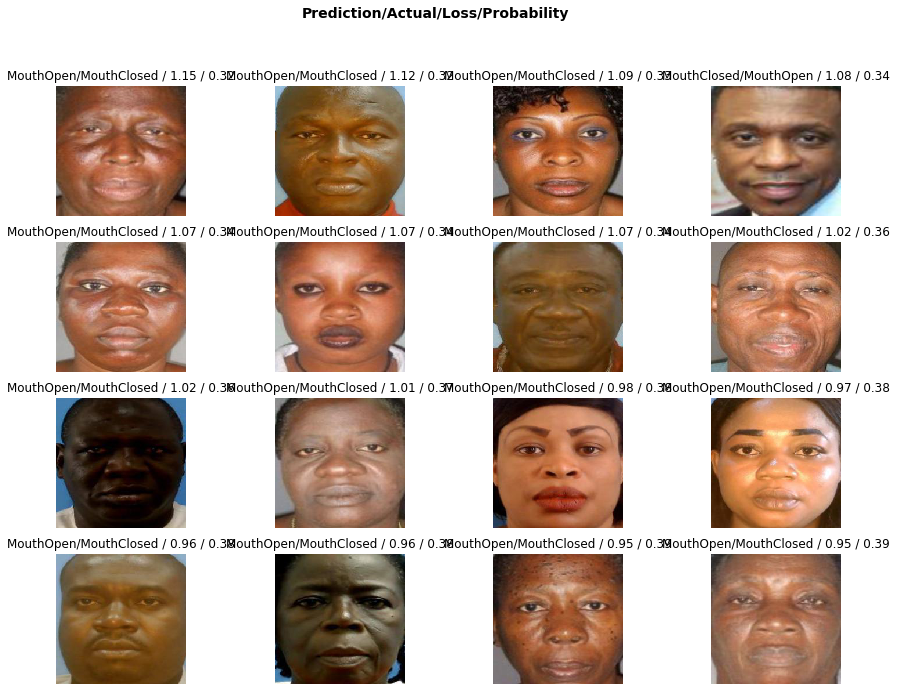

In [457]:
interp.plot_top_losses(4*4, figsize=(15,11), largest=True)

### Test on real dataset

In [471]:
ic_images = Path('/data/faces/IC_6K_MATCHES/HITS/')
ic_cropped_images = Path('../data/face/cropped_ic_6k/')

ic_images = Path('../data/temp_test/images/')
ic_cropped_images = Path('../data/temp_test_cropped/')

In [455]:
from facenet_pytorch import MTCNN
mtcnn = MTCNN(
    image_size=224, margin=0, min_face_size=20,
    thresholds=[0.6, 0.7, 0.7], factor=0.709, post_process=False,
    device='cpu'
)

dataset = ImagesWithPath(str(ic_images.parent))
dataset.idx_to_class = {i:c for c, i in dataset.class_to_idx.items()}
loader = DataLoader(dataset, collate_fn=lambda x: x[0], num_workers=1)

def create_cropped_images():
    not_found_names = []
    for x, y, path in progress_bar(loader):
        try:Image(mtcnn(x)/255.).save(str(ic_cropped_images/Path(path).name))
        except: not_found_names.append(Path(path).name)
    return not_found_names
not_found_names = create_cropped_images()
# not_found_names = list(filter(lambda p: not (ic_cropped_images/p).exists(), [path.name for path in get_image_files(ic_images)]))
len(not_found_names)

0

In [472]:
imagenet_stats = torch.tensor(([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]))
def normalize_image(x, means=imagenet_stats[0].reshape(1,3,1,1), stds=imagenet_stats[1].reshape(1,3,1,1)):
    return (x - means.to(x.device)) / stds.to(x.device) # normalize
resize_one_img = lambda x, size: F.interpolate(x[None], size=size, mode='bilinear', align_corners=True)[0]

In [473]:
out_path = Path('../data/temp/')
j = 0
for i,path in enumerate(progress_bar(get_image_files(ic_cropped_images))):
    image = open_image(path)
#     o,_,out_tensor = learner.predict(image)
    im = normalize_image(resize_one_img(image.data, (224,224))[None]).cuda()
    out_tensor = nn.Sigmoid()( learner.model(im)[0] )
    score = int(out_tensor*100)
    if score > 50: j += 1
#     image.save(out_path/(str(score)+'_'+str(i)+'.jpg'))
j, len(get_image_files(ic_cropped_images))

(7, 8)

# Smiling

In [678]:
print('{}/{}'.format(len([lbls for lbls in list(df['attributes']) if 'Smiling' in lbls]), len(df)))

97647/202303


In [679]:
create_celeba_dataset(out_dir='../data/icao/smiling_celeba/', lbl_name='Smiling', true_lbl='Smiling', false_lbl='NotSmiling')

In [411]:
tfms = get_transforms(flip_vert=False, max_lighting=0.2, max_zoom=1.1, max_warp=0.1, max_rotate=7)
data = get_binary_data('../data/icao/smiling_celeba/', tfms, main_class='Smiling')
data

ImageDataBunch;

Train: LabelList (182073 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
NotSmiling,NotSmiling,NotSmiling,NotSmiling,NotSmiling
Path: ../data/icao/smiling_celeba;

Valid: LabelList (20230 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Smiling,Smiling,Smiling,Smiling,NotSmiling
Path: ../data/icao/smiling_celeba;

Test: None

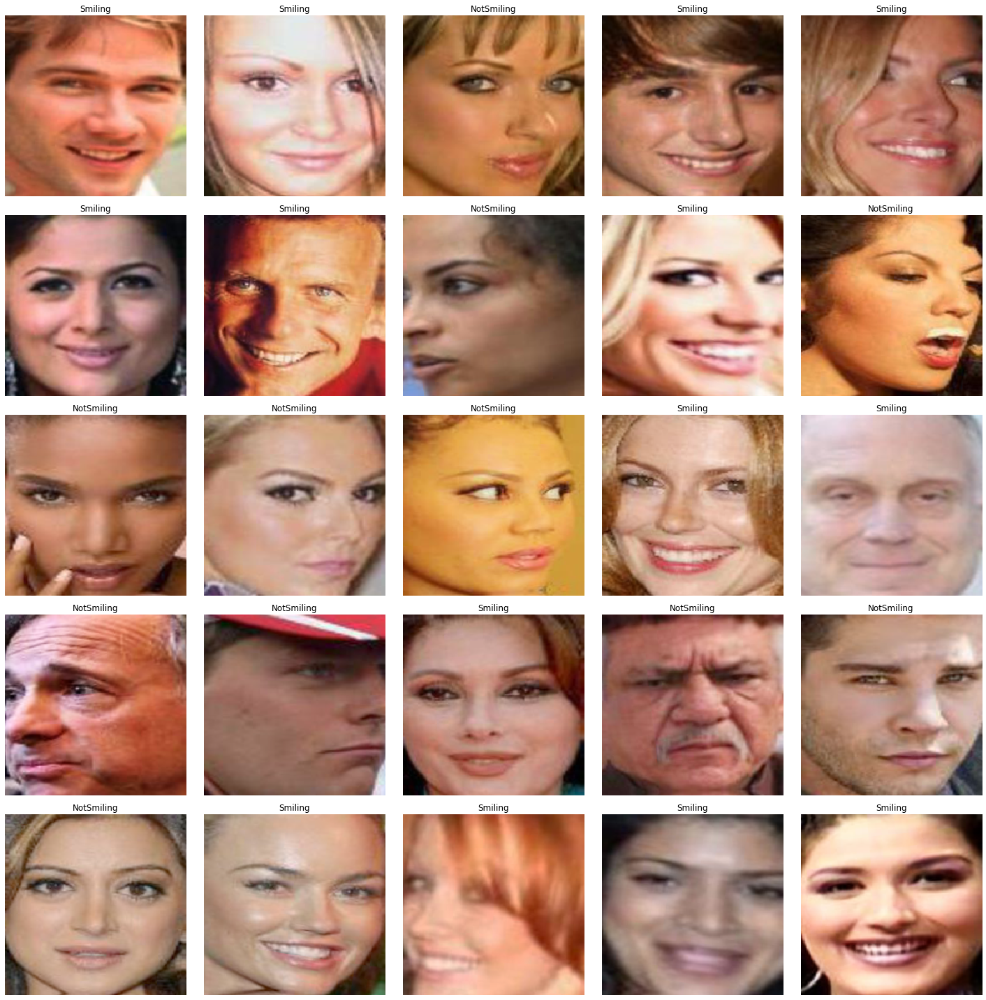

In [412]:
data.show_batch()

In [413]:
# head = create_head(num_classes=1, zero_h=[0,1,2,3])
head = create_head(num_classes=1)
model = create_head_model(test_ae, head)

In [414]:
thresh_range = (2,10,3)
metrics = [
    skmetric(accuracy_score, thresh=0.5, name='acc'),
    *[skmetric(recall_score, thresh=t/10, name='r') for t in range(*thresh_range)],
    *[skmetric(precision_score, thresh=t/10, name='p') for t in range(*thresh_range)],
    *[skmetric(negatives_recall_score, thresh=t/10, name='-r') for t in range(*thresh_range)],
#     *[skmetric(accuracy_score, thresh=t/10, name='a') for t in range(*thresh_range)],
]

epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.033836,0.021954,0.971280,0.999173,0.967657,0.772795,0.756800,0.972332,0.999221,0.702607,0.974967,0.999417,06:10
1,0.035006,0.021243,0.971873,0.998794,0.961629,0.749273,0.796542,0.979725,0.998838,0.763747,0.981717,0.999230,06:11
2,0.031876,0.021123,0.973258,0.999299,0.978336,0.820234,0.753095,0.966341,0.997980,0.696923,0.969005,0.998471,06:11


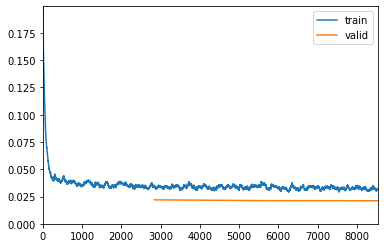

In [415]:
data = get_binary_data('../data/icao/smiling_celeba/', tfms, main_class='Smiling', split_func=None)
# loss_func = partial(binary_crossentropy, pc=2.0)
loss_func = partial(focal_loss, gamma=2.0)
learner = ( Learner(data, model, loss_func=loss_func, metrics=metrics, callback_fns=[ShowGraph]) )
# load_torch_inference(learner.model.head, '../models/celeba_head_smiling.pth')
learner.fit(3, 1e-4)

In [420]:
save_torch_inference(learner.model.head, '../models/celeba_head_smiling.pth')
data.classes

['NotSmiling', 'Smiling']

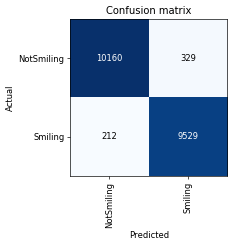

In [416]:
pred_learner = Learner(data, model, loss_func=CrossEntropyFlat())
pred_learner.model = Binary2Categorical_Model(learner.model, true_first=False)
interp = ClassificationInterpretation.from_learner(pred_learner)
interp.plot_confusion_matrix(figsize=(4,4), dpi=60)

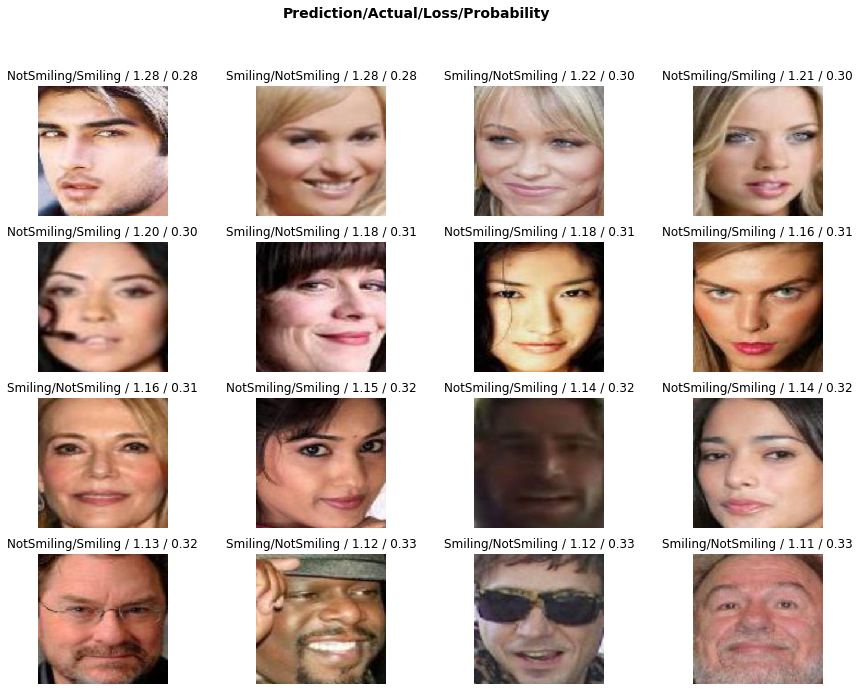

In [65]:
interp.plot_top_losses(4*4, figsize=(15,11), largest=True)

# Glasses

In [703]:
print('{}/{}'.format(len([lbls for lbls in list(df['attributes']) if 'Eyeglasses' in lbls]), len(df)))

13152/202303


In [713]:
tfms = get_transforms(flip_vert=False, max_lighting=0.1, max_zoom=1.05, max_warp=0.1, max_rotate=7)
data = get_binary_data('../data/icao/glasses_vgg/', tfms, split_func=None)
data

ImageDataBunch;

Train: LabelList (27000 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
EyeGlasses,EyeGlasses,EyeGlasses,EyeGlasses,EyeGlasses
Path: ../data/icao/glasses_vgg;

Valid: LabelList (3000 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
NoGlasses,NoGlasses,NoGlasses,NoGlasses,NoGlasses
Path: ../data/icao/glasses_vgg;

Test: None

In [714]:
data.classes

['EyeGlasses', 'NoGlasses', 'SunGlasses']

In [715]:
head = create_head(num_classes=3, zero_h=[4,5,6])
# head = create_head(num_classes=1)
model = create_head_model(test_ae, head)

epoch,train_loss,valid_loss,accuracy,time
0,0.434664,0.329393,0.886000,00:56
1,0.339895,0.259999,0.931667,00:57
2,0.285818,0.272783,0.918667,00:58
3,0.289175,0.241559,0.931000,00:58
4,0.283653,0.238987,0.944333,00:58


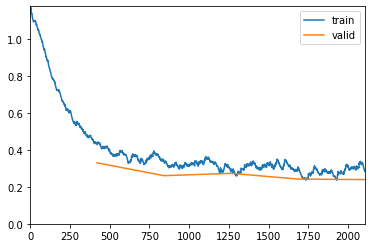

In [719]:
learner = ( Learner(data, model, loss_func=nn.CrossEntropyLoss(weight=tensor([25.,1.,30.]).cuda()), metrics=[accuracy], callback_fns=[ShowGraph]) )
learner.fit(5, 1e-4)

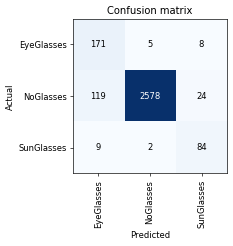

In [721]:
interp = ClassificationInterpretation.from_learner(learner)
interp.plot_confusion_matrix(figsize=(4,4), dpi=60)

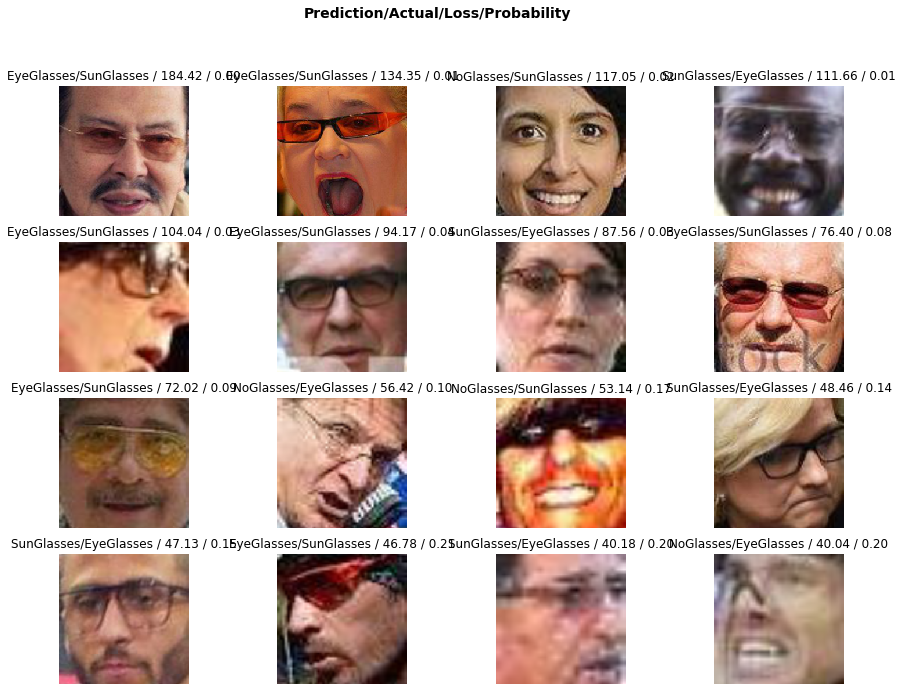

In [724]:
interp.plot_top_losses(4*4, figsize=(15,11), largest=True)

In [734]:
def create_celeba_glasses_dataset(out_dir='../data/icao/glasses_celeba/', lbl_name='Eyeglasses'):
    out_dir = Path(out_dir)
    for im_name, attrs in progress_bar(list(zip(df['img_name'], df['attributes']))):
        if lbl_name in attrs:
            image = open_image(images_dir/im_name)
            o, *_ = learner.predict(image)
            if o.obj != 'NoGlasses':
                image.save(out_dir/o.obj/im_name)
# create_celeba_glasses_dataset()

In [403]:
data = get_binary_data('../data/icao/glasses_all/', tfms, split_func=None)
data

ImageDataBunch;

Train: LabelList (38801 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
EyeGlasses,EyeGlasses,EyeGlasses,EyeGlasses,EyeGlasses
Path: ../data/icao/glasses_all;

Valid: LabelList (4311 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
NoGlasses,EyeGlasses,SunGlasses,NoGlasses,NoGlasses
Path: ../data/icao/glasses_all;

Test: None

In [404]:
data.classes

['EyeGlasses', 'NoGlasses', 'SunGlasses']

In [405]:
# head = create_head(num_classes=3, zero_h=[4,5,6])
head = create_head(num_classes=3)
model = create_head_model(test_ae, head)

In [406]:
def multi_skmetric(metric_func, thresh='', name=None):
    def f(y_pred, y_true):
        y_pred = y_pred.argmax(-1).long()
        return tensor(metric_func(y_true, y_pred))
    name = metric_func.__name__ if name is None else name
    f.__name__ = name + str(thresh)
    return f

In [407]:
thresh_range = (2,10,3)
glasses_metrics = [
    multi_skmetric(accuracy_score, thresh=0.5, name='acc'),
    multi_skmetric(partial(recall_score, average='macro'), name='recall'),
    multi_skmetric(partial(precision_score, average='macro'), name='prec'),
    multi_skmetric(partial(f1_score, average='macro'), name='f1'),
]

epoch,train_loss,valid_loss,acc0.5,recall,prec,f1,time
0,0.194063,0.147784,0.968221,0.950664,0.944052,0.944791,01:19
1,0.179120,0.134607,0.964045,0.952681,0.931247,0.938652,01:20
2,0.178954,0.130275,0.965437,0.950547,0.934753,0.938756,01:20
3,0.172656,0.128972,0.971236,0.954121,0.949418,0.949375,01:20
4,0.154956,0.124999,0.970077,0.955638,0.944780,0.947836,01:21
5,0.153740,0.125971,0.971004,0.957177,0.945804,0.948217,01:20
6,0.158002,0.122279,0.970309,0.958842,0.943831,0.947777,01:20
7,0.141723,0.117116,0.971236,0.960109,0.948474,0.951186,01:20
8,0.142874,0.116272,0.969845,0.958773,0.943065,0.947640,01:20
9,0.139577,0.119396,0.971700,0.962285,0.946336,0.950655,01:20


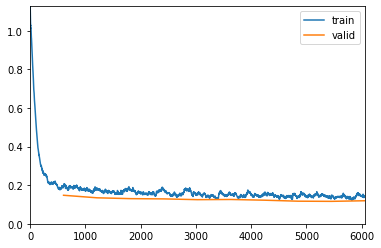

In [408]:
learner = ( Learner(data, model, loss_func=nn.CrossEntropyLoss(weight=tensor([3.,1.,6.]).cuda()), metrics=glasses_metrics, callback_fns=[ShowGraph]) )
learner.fit(10, 1e-4)

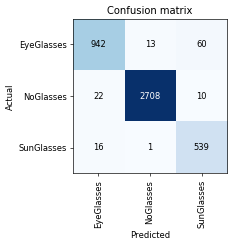

In [410]:
interp = ClassificationInterpretation.from_learner(learner)
interp.plot_confusion_matrix(figsize=(4,4), dpi=60)

In [409]:
save_torch_inference(learner.model.head, '../models/celeba_head_glasses.pth')

# LookingAway

In [458]:
tfms = get_transforms(flip_vert=False, max_lighting=0.2, max_zoom=1.1, max_warp=0.1, max_rotate=7)
data = get_binary_data('../data/icao/lookingaway_unlabeled/', tfms, main_class='LookingAway')
data

ImageDataBunch;

Train: LabelList (10513 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
LookingAway,LookingAway,LookingAway,LookingAway,LookingAway
Path: ../data/icao/lookingaway_unlabeled;

Valid: LabelList (1168 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
LookingAhead,LookingAhead,LookingAway,LookingAway,LookingAhead
Path: ../data/icao/lookingaway_unlabeled;

Test: None

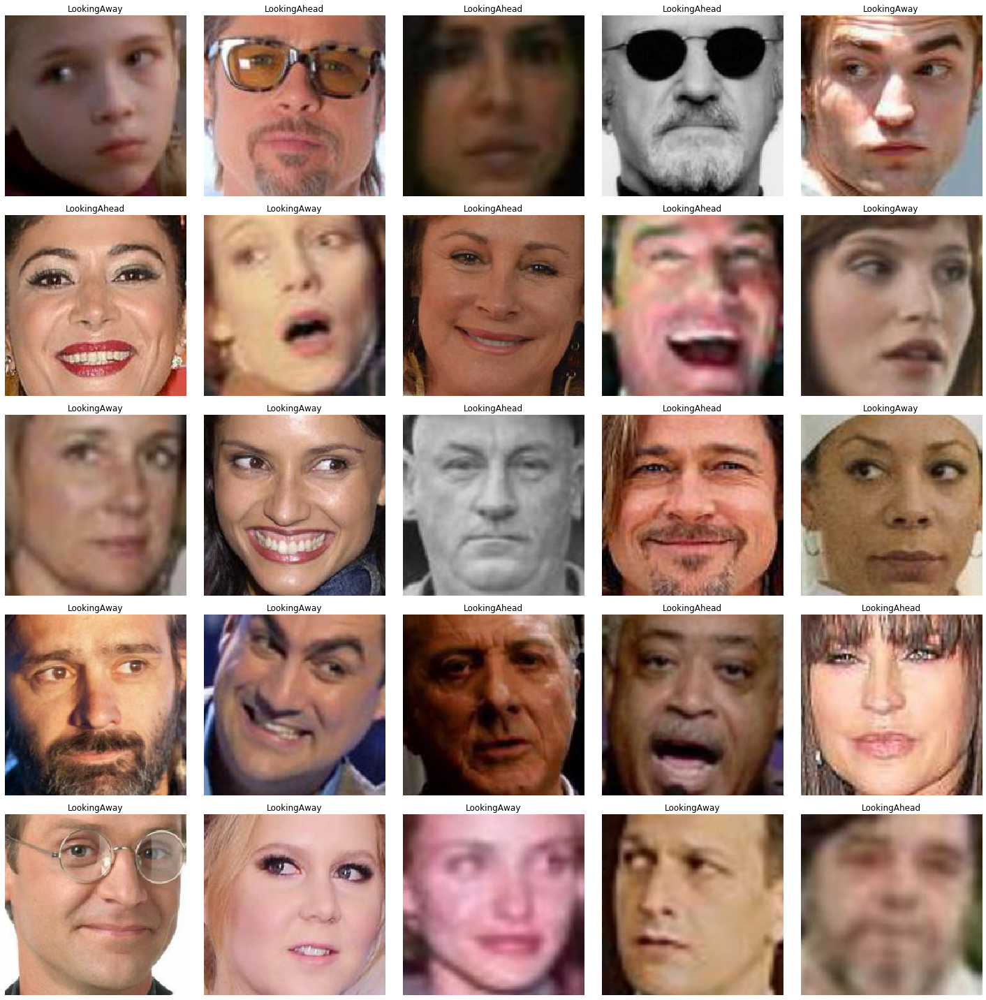

In [67]:
data.show_batch()

In [465]:
# head = create_head(num_classes=1, zero_h=[4,5,6])
head = create_head(num_classes=1)
model = create_head_model(test_ae, head)

In [466]:
thresh_range = (2,10,3)
metrics = [
    skmetric(accuracy_score, thresh=0.5, name='acc'),
    *[skmetric(recall_score, thresh=t/10, name='r') for t in range(*thresh_range)],
    *[skmetric(precision_score, thresh=t/10, name='p') for t in range(*thresh_range)],
    *[skmetric(negatives_recall_score, thresh=t/10, name='-r') for t in range(*thresh_range)]
]

epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.460465,0.369603,0.871575,0.984893,0.938081,0.825945,0.707200,0.847044,0.951906,0.480323,0.785670,0.945442,00:23


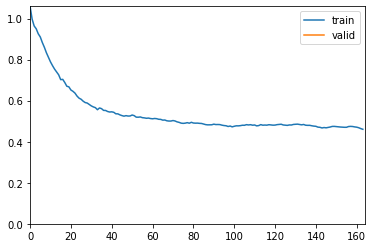

epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.406032,0.358880,0.892123,0.986230,0.939646,0.859289,0.712286,0.875193,0.952969,0.494429,0.830660,0.946284,00:24
1,0.392775,0.315536,0.899829,0.984850,0.936476,0.857969,0.732789,0.889207,0.959823,0.544601,0.850821,0.953136,00:24
2,0.388123,0.374463,0.906678,0.981886,0.928746,0.838489,0.777549,0.906197,0.970502,0.643731,0.877254,0.966854,00:23
3,0.371875,0.305911,0.904110,0.984850,0.938979,0.867235,0.750545,0.892693,0.956742,0.586235,0.857867,0.949455,00:24
4,0.367194,0.295810,0.907534,0.984604,0.940877,0.870045,0.755958,0.897643,0.962356,0.597884,0.862778,0.955278,00:23
5,0.362388,0.293522,0.910959,0.988139,0.946083,0.861777,0.762165,0.899876,0.965836,0.610312,0.863998,0.961490,00:24
6,0.349618,0.289008,0.913527,0.984526,0.942990,0.864599,0.778724,0.905916,0.957894,0.647104,0.875423,0.951761,00:23
7,0.352746,0.285468,0.910959,0.987859,0.949093,0.877617,0.777567,0.897193,0.958416,0.642202,0.860891,0.951912,00:23
8,0.341086,0.283461,0.914384,0.978426,0.934343,0.857793,0.805354,0.913117,0.969499,0.698902,0.887238,0.965409,00:24
9,0.337416,0.290029,0.916952,0.972668,0.921485,0.829921,0.829120,0.927187,0.980158,0.745824,0.908584,0.978918,00:23


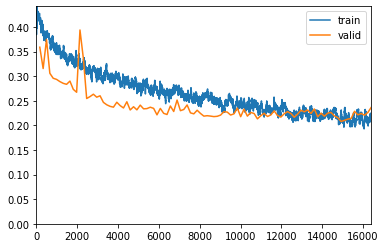

In [467]:
loss_func = partial(binary_crossentropy, pc=2.0)
# loss_func = partial(focal_loss, gamma=2.0)
learner = ( Learner(data, model, loss_func=loss_func, metrics=metrics, callback_fns=[ShowGraph]) )
# load_torch_inference(learner.model.head, '../models/celeba_head_eyesopen.pth')
learner.fit(1, 1e-3)
learner.fit(100, 1e-4)

In [468]:
save_torch_inference(learner.model.head, '../models/celeba_head_lookingaway.pth')
data.classes

['LookingAhead', 'LookingAway']

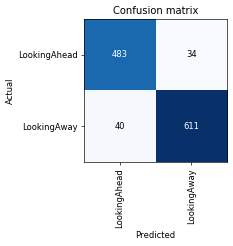

In [469]:
pred_learner = Learner(data, model, loss_func=CrossEntropyFlat())
pred_learner.model = Binary2Categorical_Model(learner.model, true_first=False)
interp = ClassificationInterpretation.from_learner(pred_learner)
interp.plot_confusion_matrix(figsize=(4,4), dpi=60)

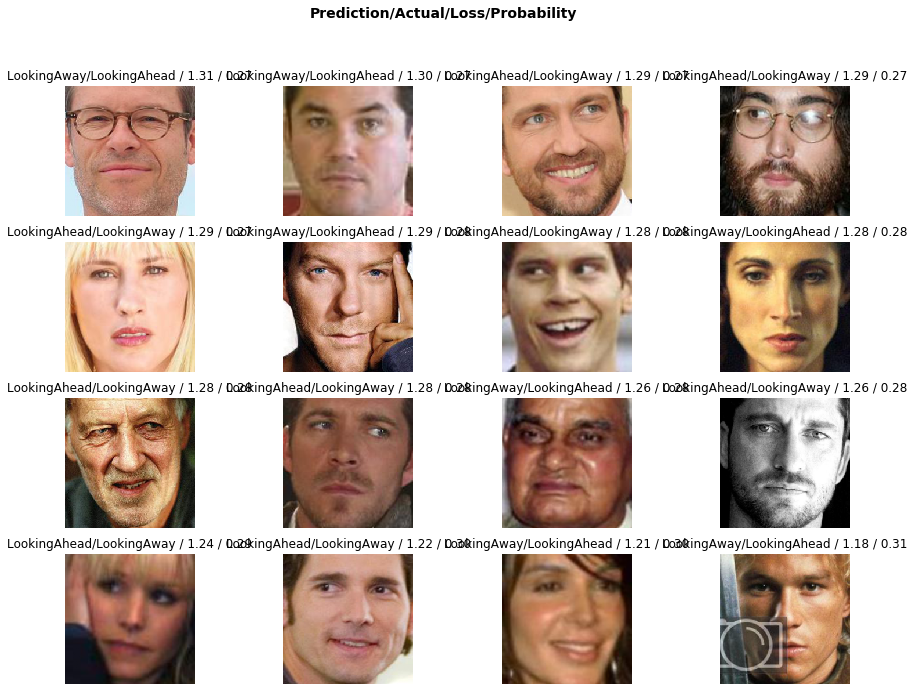

In [470]:
interp.plot_top_losses(4*4, figsize=(15,11), largest=True)

# FaceDarkness

In [473]:
def create_celeba_dark_dataset(out_dir='../data/icao/darkface_celeba/'):
    true_lbl, false_lbl = 'DarkFace', 'BrightFace'
    out_dir = Path(out_dir)
    for im_name, attrs in progress_bar(list(zip(df['img_name'], df['attributes']))):
        image = open_image(images_dir/im_name)
        if random.random() > 0.5: data_name = false_lbl
        else: image, data_name = brightness(image, random.random()*0.1+0.05), true_lbl
        image.save(out_dir/data_name/im_name)
# create_celeba_dark_dataset()

In [474]:
tfms = get_transforms(flip_vert=False, max_lighting=0.05, max_zoom=1.1, max_warp=0.1, max_rotate=7)
data = get_binary_data('../data/icao/darkface_celeba/', tfms, main_class='DarkFace')
data

ImageDataBunch;

Train: LabelList (272764 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
DarkFace,DarkFace,DarkFace,DarkFace,DarkFace
Path: ../data/icao/darkface_celeba;

Valid: LabelList (30307 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
DarkFace,BrightFace,BrightFace,BrightFace,DarkFace
Path: ../data/icao/darkface_celeba;

Test: None

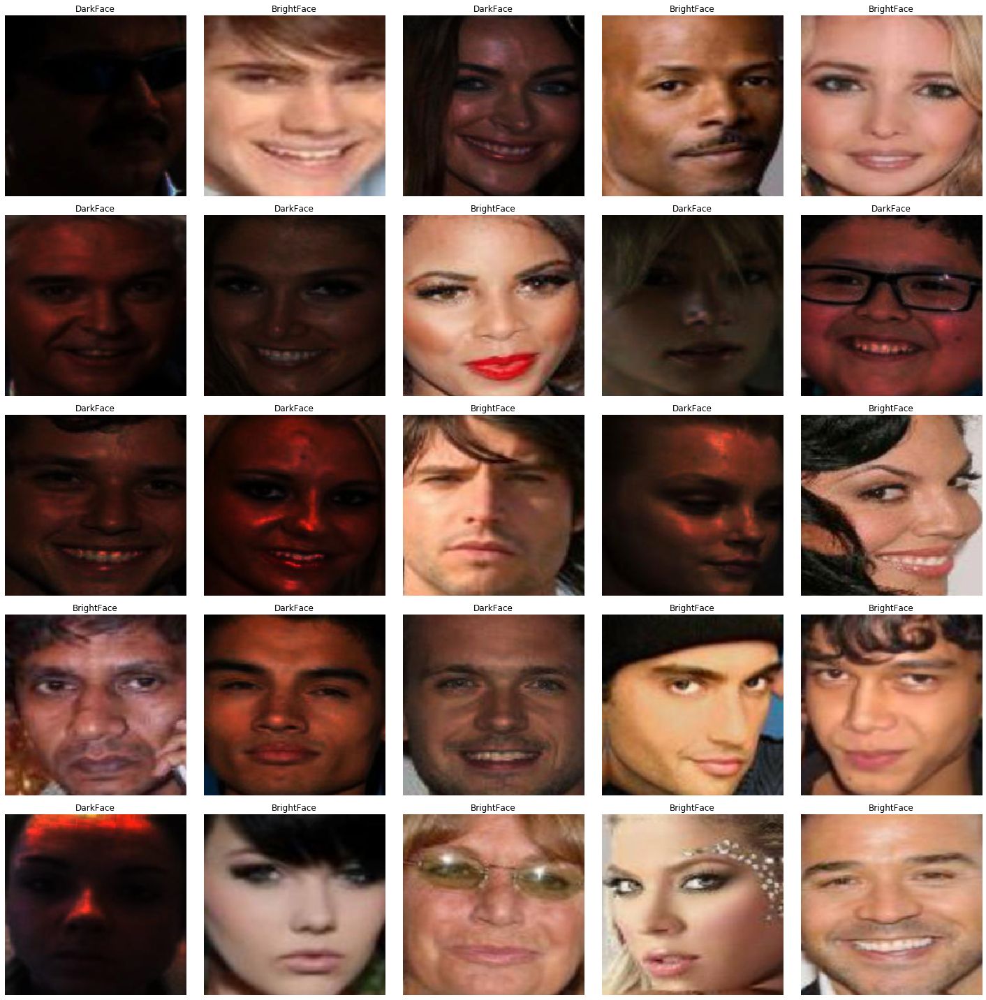

In [166]:
data.show_batch()

In [475]:
head = create_head(num_classes=1)
model = create_head_model(test_ae, head)

In [477]:
loss_func = partial(binary_crossentropy, pc=0.4)
# loss_func = partial(focal_loss, gamma=2.0)
learner = ( Learner(data, model, loss_func=loss_func, metrics=metrics, callback_fns=[ShowGraph]) )
# load_torch_inference(learner.model.head, '../models/celeba_head_darkface.pth')
learner.fit(3, 1e-4)

In [270]:
save_torch_inference(learner.model.head, '../models/celeba_head_darkface.pth')
data.classes

['BrightFace', 'DarkFace']

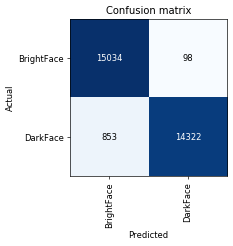

In [271]:
pred_learner = Learner(data, model, loss_func=CrossEntropyFlat())
pred_learner.model = Binary2Categorical_Model(learner.model, true_first=False)
interp = ClassificationInterpretation.from_learner(pred_learner)
interp.plot_confusion_matrix(figsize=(4,4), dpi=60)

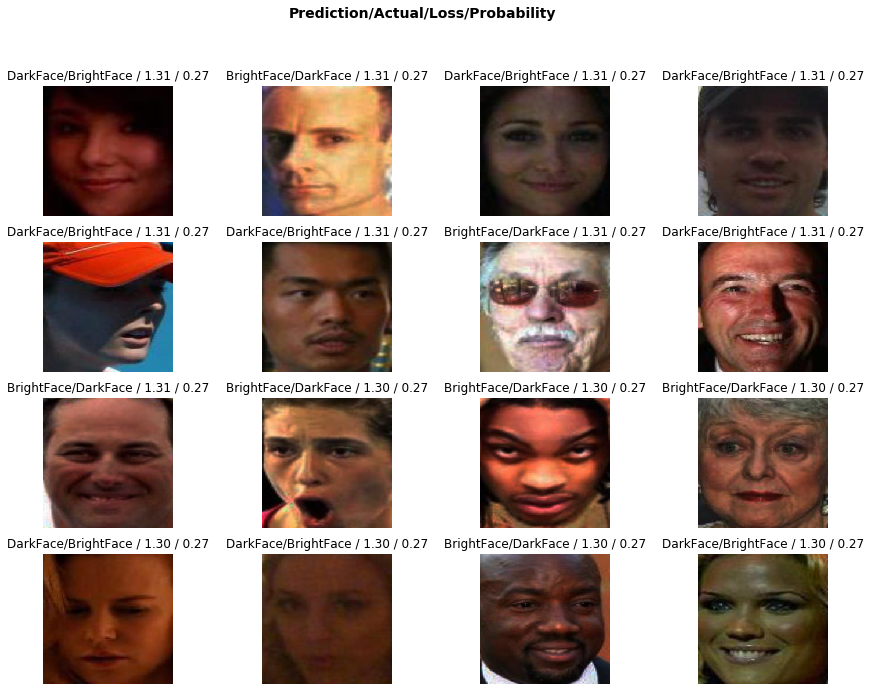

In [173]:
interp.plot_top_losses(4*4, figsize=(15,11), largest=True)

# EyesOpen

In [488]:
tfms = get_transforms(flip_vert=False, max_lighting=0.4, max_zoom=1.1, max_warp=0.1, max_rotate=7)
data = get_binary_data('../data/icao/eyesopen_lfw/', tfms, main_class='EyesOpen')
data

ImageDataBunch;

Train: LabelList (6182 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
EyesOpen,EyesOpen,EyesOpen,EyesOpen,EyesOpen
Path: ../data/icao/eyesopen_lfw;

Valid: LabelList (686 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
EyesOpen,EyesOpen,EyesOpen,EyesOpen,EyesClosed
Path: ../data/icao/eyesopen_lfw;

Test: None

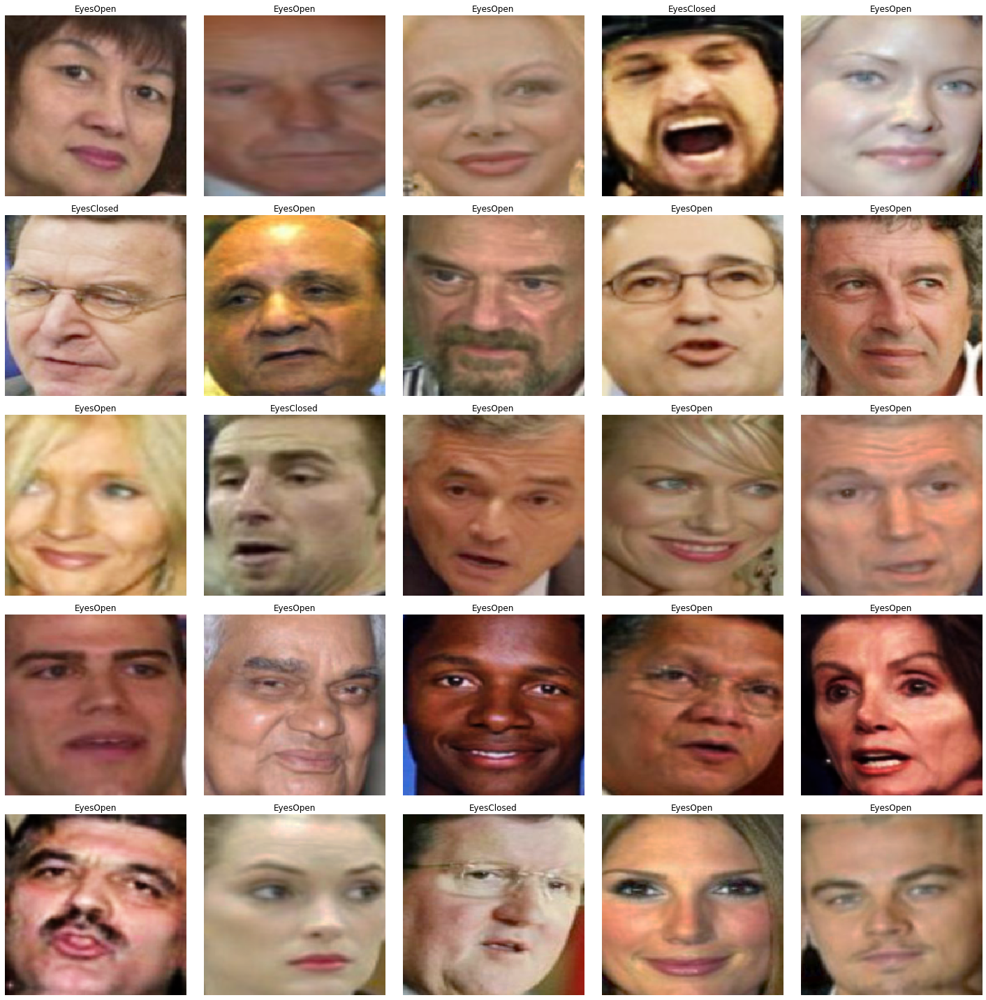

In [491]:
data.show_batch()

In [507]:
# head = create_head(num_classes=1, zero_h=[4,5,6])
head = create_head(num_classes=1)
model = create_head_model(test_ae, head)

epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.391122,0.390615,0.855685,0.992005,0.968701,0.905431,0.792062,0.856353,0.904211,0.226929,0.525409,0.699815,00:14


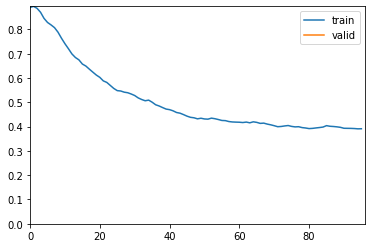

epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.319734,0.356899,0.871720,0.981918,0.943725,0.831786,0.838259,0.892771,0.935026,0.432976,0.651656,0.822800,00:14
1,0.307035,0.348642,0.879009,0.982006,0.941821,0.838571,0.843603,0.902452,0.939330,0.453068,0.689986,0.836396,00:14
2,0.308079,0.341274,0.879009,0.988092,0.949355,0.849369,0.836058,0.895885,0.941961,0.419314,0.665464,0.840867,00:14
3,0.290902,0.346430,0.881924,0.970337,0.936218,0.838294,0.853697,0.911001,0.944887,0.501800,0.715525,0.851233,00:14
4,0.290322,0.341143,0.871720,0.978218,0.938084,0.847596,0.848875,0.897038,0.942525,0.481884,0.669662,0.841574,00:14
5,0.286598,0.336775,0.887755,0.974161,0.945652,0.837914,0.852616,0.909225,0.947613,0.496752,0.713881,0.860019,00:15
6,0.283253,0.339580,0.877551,0.968656,0.930344,0.838150,0.858163,0.909872,0.945226,0.517686,0.715493,0.852957,00:15
7,0.276682,0.334772,0.887755,0.972444,0.953575,0.857894,0.852523,0.903075,0.944306,0.496752,0.689527,0.843763,00:15
8,0.275799,0.335394,0.883382,0.968622,0.933999,0.849955,0.861263,0.913312,0.946059,0.525305,0.729735,0.852245,00:15
9,0.267731,0.334907,0.879009,0.968935,0.934080,0.847790,0.862811,0.908287,0.948001,0.531672,0.710310,0.860732,00:15


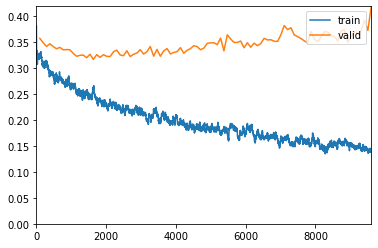

In [508]:
loss_func = partial(binary_crossentropy, pc=1.3)
# loss_func = partial(focal_loss, gamma=2.0)
learner = ( Learner(data, model, loss_func=loss_func, metrics=metrics, callback_fns=[ShowGraph]) )
# load_torch_inference(learner.model.head, '../models/celeba_head_lookingaway.pth')
learner.fit(1, 1e-3)
learner.fit(100, 1e-4)

In [509]:
save_torch_inference(learner.model.head, '../models/celeba_head_eyesopen.pth')
data.classes

['EyesClosed', 'EyesOpen']

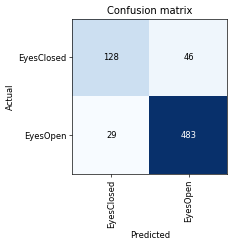

In [510]:
pred_learner = Learner(data, model, loss_func=CrossEntropyFlat())
pred_learner.model = Binary2Categorical_Model(learner.model, true_first=False)
interp = ClassificationInterpretation.from_learner(pred_learner)
interp.plot_confusion_matrix(figsize=(4,4), dpi=60)

In [ ]:
interp.plot_top_losses(4*4, figsize=(15,11), largest=True)

# EyesOpen (w/ eyes cropped)

In [ ]:
import face_recognition
image = face_recognition.load_image_file("your_file.jpg")
face_landmarks_list = face_recognition.face_landmarks(image)

In [ ]:
eyesopen_dir = Path('../data/icao/eyesopen_lfw/')
cropped_eyesopen_dir = Path('../data/icao/eyesopen_cropped_lfw/')

In [335]:
import face_recognition
def find_eyes(im_path, face_locations):
    image_np = face_recognition.load_image_file(im_path)
    face_landmarks = face_recognition.face_landmarks(image_np, face_locations=face_locations)[0]
    landmarks = np.array(face_landmarks['left_eye'] + face_landmarks['right_eye'])
    image = open_image(im_path)
#     image.show(y=ImagePoints(FlowField(image.size, tensor(landmarks)), scale=True, y_first=False))
    left_eye, right_eye = landmarks[:6], landmarks[6:]
    left_bbox, right_bbox = map(lambda eye: [eye[:,1].min(),eye[:,0].min(),eye[:,1].max(),eye[:,0].max()], [left_eye, right_eye])
    return left_bbox, right_bbox

In [336]:
def create_cropped_eyes_data():
    for data_name in ['EyesOpen', 'EyesClosed']:
        for im_path in progress_bar(list((eyesopen_dir/data_name).iterdir())):
            image = open_image(im_path)
            left_bbox, right_bbox = find_eyes(im_path, face_locations=[(0,0,*image.size)])

            im = torch.zeros_like(image.data)
            x_pad, y_pad = 15, 20
            for t,l,b,r in [left_bbox, right_bbox]:
                l, r = l-x_pad, r+x_pad
                h_middle = (b-t)//2
                t, b = t-y_pad, b+y_pad
                area = (b-t,r-l)
                im[:,t:b,l:r] = image.data[:,t:b,l:r]
            Image(im).save(cropped_eyesopen_dir/data_name/im_path.name)
# create_cropped_eyes_data()

In [515]:
tfms = get_transforms(flip_vert=False, max_lighting=0.2, max_zoom=1.1, max_warp=0.1, max_rotate=7)
data = get_binary_data(cropped_eyesopen_dir, tfms, main_class='EyesOpen')
data

ImageDataBunch;

Train: LabelList (11829 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
EyesOpen,EyesOpen,EyesOpen,EyesOpen,EyesOpen
Path: ../data/icao/eyesopen_cropped_lfw;

Valid: LabelList (1314 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
EyesOpen,EyesOpen,EyesOpen,EyesOpen,EyesOpen
Path: ../data/icao/eyesopen_cropped_lfw;

Test: None

ImageDataBunch;

Train: LabelList (11829 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
EyesOpen,EyesOpen,EyesOpen,EyesOpen,EyesOpen
Path: ../data/icao/eyesopen_cropped_lfw;

Valid: LabelList (1314 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
EyesOpen,EyesOpen,EyesOpen,EyesOpen,EyesOpen
Path: ../data/icao/eyesopen_cropped_lfw;

Test: None

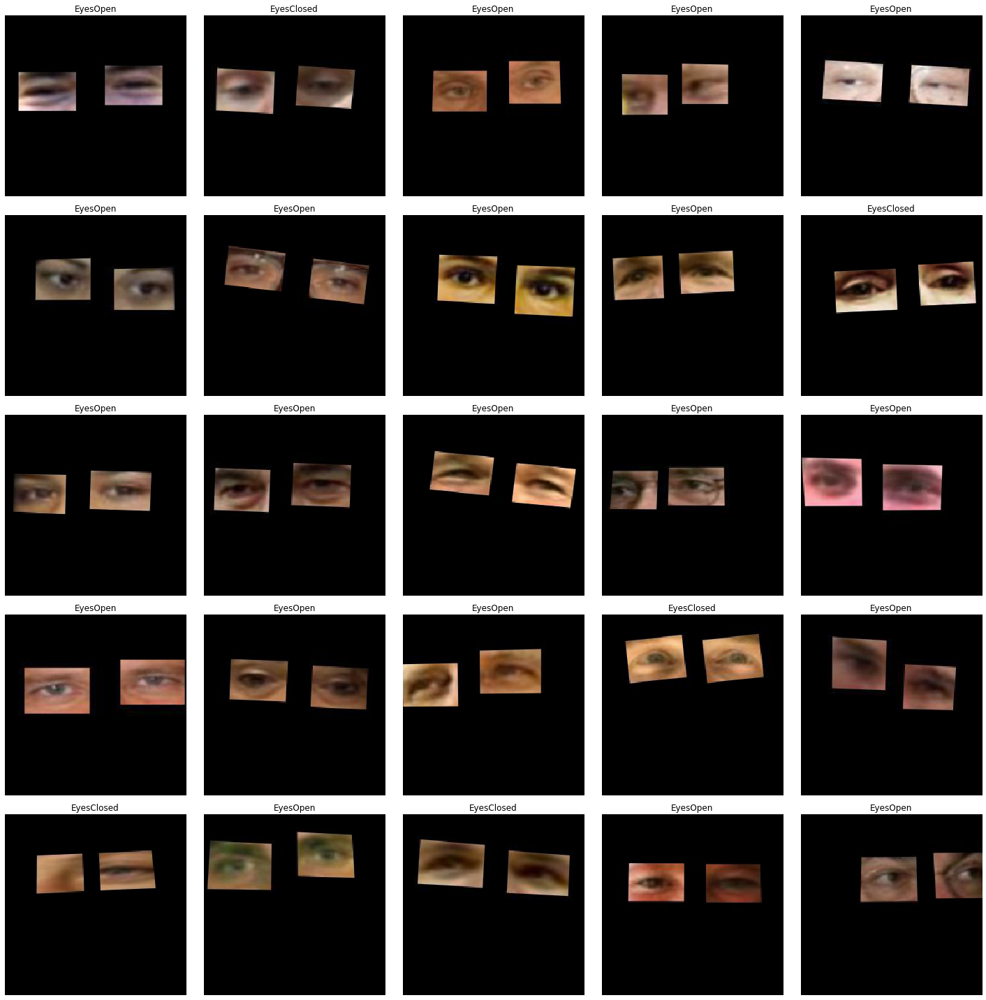

In [338]:
data.show_batch()

In [516]:
# head = create_head(num_classes=1, zero_h=[4,5,6])
head = create_head(num_classes=1)
model = create_head_model(test_ae, head)

epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.196712,0.183790,0.878995,0.998363,0.953383,0.772135,0.888366,0.913324,0.956078,0.079127,0.347123,0.765315,00:26


epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.196712,0.183790,0.878995,0.998363,0.953383,0.772135,0.888366,0.913324,0.956078,0.079127,0.347123,0.765315,00:26


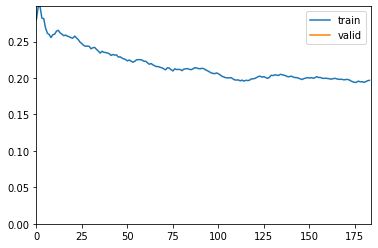

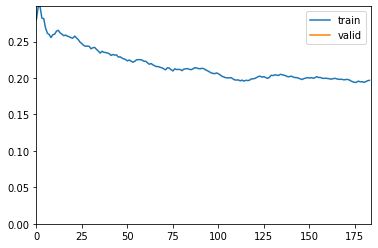

epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.185074,0.167746,0.830289,0.987215,0.852199,0.543081,0.898662,0.949672,0.980486,0.194732,0.693550,0.929217,00:26
1,0.182706,0.164571,0.842466,0.987268,0.869971,0.561071,0.898149,0.947302,0.979797,0.195133,0.666400,0.925470,00:26
2,0.181419,0.165435,0.831050,0.984749,0.853924,0.556828,0.901436,0.949055,0.982686,0.226638,0.688064,0.937334,00:26
3,0.180357,0.167473,0.822679,0.981274,0.847154,0.549173,0.904699,0.945838,0.982279,0.255731,0.665183,0.938458,00:26
4,0.183895,0.165534,0.826484,0.981302,0.851413,0.575817,0.902457,0.946011,0.981779,0.235881,0.667270,0.933588,00:26
5,0.179560,0.164776,0.836378,0.979559,0.859933,0.575795,0.905324,0.949072,0.978602,0.277373,0.682691,0.917352,00:26
6,0.179754,0.164652,0.834094,0.984822,0.860002,0.589417,0.903644,0.946317,0.976398,0.250585,0.658512,0.914498,00:26
7,0.186070,0.163712,0.833333,0.982908,0.856485,0.563170,0.904078,0.948707,0.980145,0.259108,0.679212,0.925470,00:26
8,0.178262,0.164512,0.842466,0.982006,0.873847,0.589060,0.904158,0.943054,0.978253,0.255905,0.642432,0.916853,00:26
9,0.174636,0.163949,0.838661,0.976964,0.866947,0.580526,0.905201,0.945171,0.979565,0.268255,0.656883,0.921723,00:26


epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.185074,0.167746,0.830289,0.987215,0.852199,0.543081,0.898662,0.949672,0.980486,0.194732,0.693550,0.929217,00:26
1,0.182706,0.164571,0.842466,0.987268,0.869971,0.561071,0.898149,0.947302,0.979797,0.195133,0.666400,0.925470,00:26
2,0.181419,0.165435,0.831050,0.984749,0.853924,0.556828,0.901436,0.949055,0.982686,0.226638,0.688064,0.937334,00:26
3,0.180357,0.167473,0.822679,0.981274,0.847154,0.549173,0.904699,0.945838,0.982279,0.255731,0.665183,0.938458,00:26
4,0.183895,0.165534,0.826484,0.981302,0.851413,0.575817,0.902457,0.946011,0.981779,0.235881,0.667270,0.933588,00:26
5,0.179560,0.164776,0.836378,0.979559,0.859933,0.575795,0.905324,0.949072,0.978602,0.277373,0.682691,0.917352,00:26
6,0.179754,0.164652,0.834094,0.984822,0.860002,0.589417,0.903644,0.946317,0.976398,0.250585,0.658512,0.914498,00:26
7,0.186070,0.163712,0.833333,0.982908,0.856485,0.563170,0.904078,0.948707,0.980145,0.259108,0.679212,0.925470,00:26
8,0.178262,0.164512,0.842466,0.982006,0.873847,0.589060,0.904158,0.943054,0.978253,0.255905,0.642432,0.916853,00:26
9,0.174636,0.163949,0.838661,0.976964,0.866947,0.580526,0.905201,0.945171,0.979565,0.268255,0.656883,0.921723,00:26


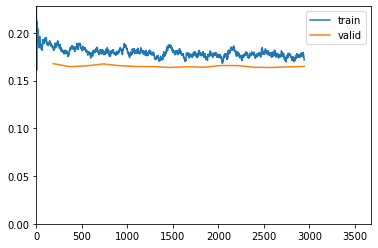

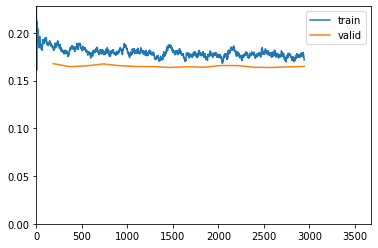

In [ ]:
loss_func = partial(binary_crossentropy, pc=0.3)
# loss_func = partial(focal_loss, gamma=2.0)
learner = ( Learner(data, model, loss_func=loss_func, metrics=metrics, callback_fns=[ShowGraph]) )
# load_torch_inference(learner.model.head, '../models/celeba_head_lookingaway.pth')
learner.fit(1, 1e-3)
learner.fit(20, 1e-4)

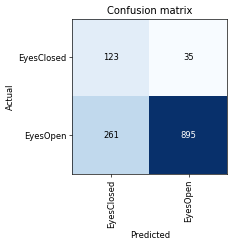

In [345]:
pred_learner = Learner(data, model, loss_func=CrossEntropyFlat())
pred_learner.model = Binary2Categorical_Model(learner.model, true_first=False)
interp = ClassificationInterpretation.from_learner(pred_learner)
interp.plot_confusion_matrix(figsize=(4,4), dpi=60)

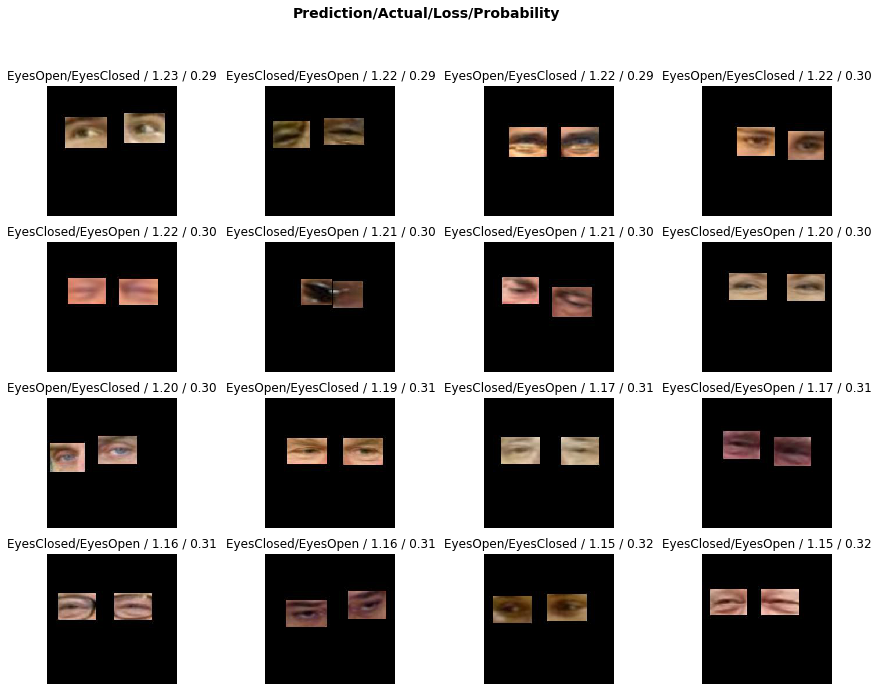

In [346]:
interp.plot_top_losses(4*4, figsize=(15,11), largest=True)

# Flash

In [187]:
tfms = get_transforms(flip_vert=False, max_lighting=0.1, max_zoom=1.1, max_warp=0.1, max_rotate=7)
data = get_binary_data('../data/icao/flash_lfw/', tfms, main_class='FlashOn', bs=16)
data

ImageDataBunch;

Train: LabelList (11829 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
FlashOn,FlashOn,FlashOn,FlashOn,FlashOn
Path: ../data/icao/flash_lfw;

Valid: LabelList (1314 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
FlashOff,FlashOff,FlashOn,FlashOff,FlashOff
Path: ../data/icao/flash_lfw;

Test: None

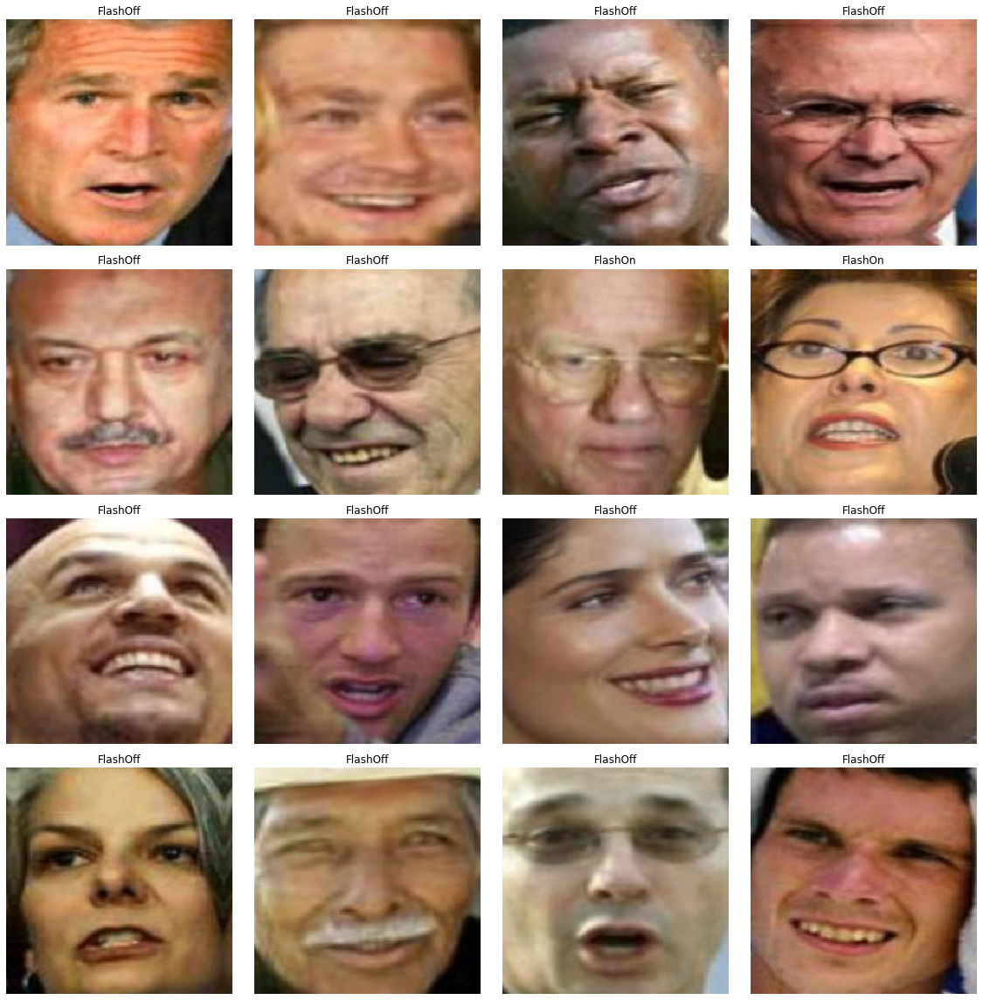

In [188]:
data.show_batch()

In [191]:
# head = create_head(num_classes=1, zero_h=[4,5,6])
head = create_head(num_classes=1)
model = create_head_model(test_ae, head)

In [ ]:
loss_func = partial(binary_crossentropy, pc=2)
# loss_func = partial(focal_loss, gamma=2.0)
learner = ( Learner(data, model, loss_func=loss_func, metrics=metrics, callback_fns=[ShowGraph]) )
# load_torch_inference(learner.model.head, '../models/celeba_head_flash.pth')
learner.fit(5, 1e-4)

epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time


epoch,train_loss,valid_loss,acc0.5,r0.2,r0.5,r0.8,p0.2,p0.5,p0.8,-r0.2,-r0.5,-r0.8,time
0,0.248999,0.327843,0.863775,0.945408,0.871537,0.659143,0.476317,0.606355,0.756150,0.729369,0.858363,0.949536,00:27
1,0.284258,0.298523,0.890411,0.908067,0.819772,0.581605,0.530834,0.698282,0.798985,0.789992,0.909156,0.966716,00:27
2,0.297017,0.313930,0.898021,0.892121,0.771472,0.552077,0.543764,0.711184,0.784982,0.803212,0.923892,0.970654,00:27
3,0.278739,0.306465,0.894216,0.898616,0.795303,0.562586,0.568944,0.734280,0.801725,0.818173,0.918560,0.970757,00:28
4,0.261053,0.329313,0.885845,0.894774,0.805161,0.630108,0.545401,0.681776,0.776763,0.802907,0.904815,0.959500,00:28


/home/dominykas/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples.
  'recall', 'true', average, warn_for)
/home/dominykas/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


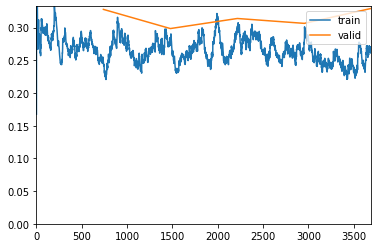

In [195]:
loss_func = partial(binary_crossentropy, pc=1.5)
# loss_func = partial(focal_loss, gamma=2.0)
learner = ( Learner(data, model, loss_func=loss_func, metrics=metrics, callback_fns=[ShowGraph]) )
# load_torch_inference(learner.model.head, '../models/celeba_head_flash.pth')
learner.fit(5, 1e-4)

In [198]:
save_torch_inference(learner.model.head, '../models/celeba_head_flash.pth')
data.classes

['FlashOff', 'FlashOn']

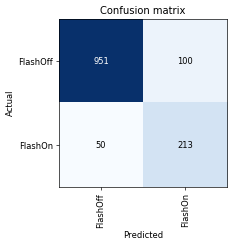

In [196]:
pred_learner = Learner(data, model, loss_func=CrossEntropyFlat())
pred_learner.model = Binary2Categorical_Model(learner.model, true_first=False)
interp = ClassificationInterpretation.from_learner(pred_learner)
interp.plot_confusion_matrix(figsize=(4,4), dpi=60)

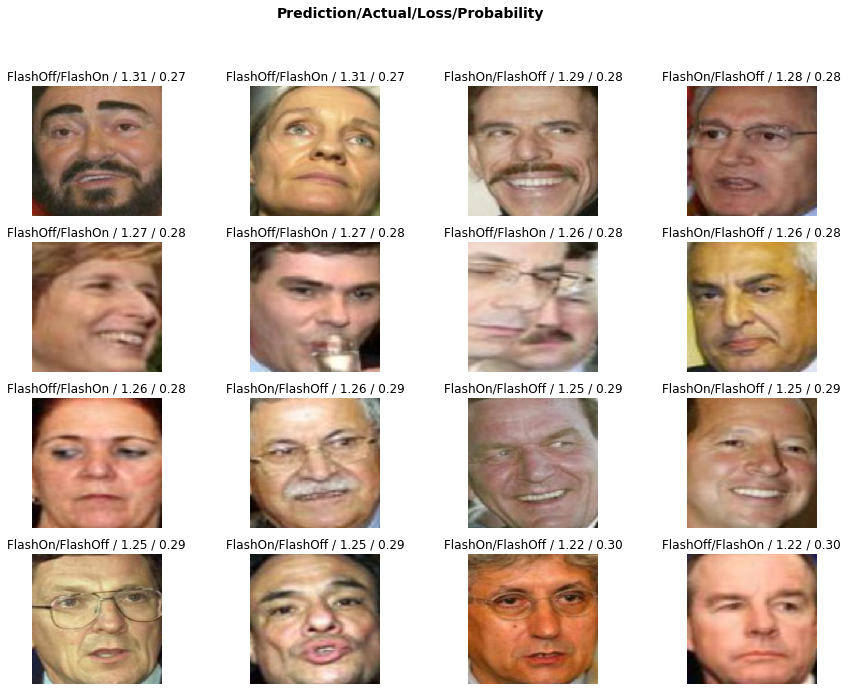

In [197]:
interp.plot_top_losses(4*4, figsize=(15,11), largest=True)